# Scraping data with TOAR V2 API

## Latest data, and most recent API

### Stitched together from tutorials at [this GitLab hosted by Julich,](https://gitlab.jsc.fz-juelich.de/esde/toar-public/toar-data-user-workshop-2022) in addition to altered code from V1 of the TOAR API.

To do:

1. Isolate stations of interest
    - *With coordinates?*
    - *By country?*


2. Check we have the right stations with the cartopy plotting method

3. Then download ozone, NOx, environmental and then land cover attributes for each station
    * Each variable has its own time series - so we slightly need to search for all time series at each station.
    * Furthermore, some variables may have more that one series for each station - what do we do for these? Which to select?
    * Then each time series (of different lengths) need to be stitched together for each station
    * The question is also what to do with missing values?
    * *Tricky part is going to be downloading them at the same time?*
    * *Previously we had to split them - there has to be an easier way of doing this.*
    * *I will also functionalise everything so that is easy.*


4. Check that we do not have duplicates, or any problems with these.

Statistics have to be downloaded with v1 of the API.

Issues:
* In this [video](https://b2drop.eudat.eu/s/pdszR7CKZJnJbw7?dir=undefined&openfile=39251595), Dr. Schultz suggests that ERA-5 data will be available for all countries by October. Emailed to ask if it will be available sooner.
* This essentially means that we are stuck with v1 until then. So let's work on that v1 data until then.

* **However**, for robustness tests, I could use the Germany and USA data where ERA5 is already available, and test the models on this data which is available already. This would be a good test - new countries, and different time period.
* Given this, let's make sure this works well for Germany and the USA.

### Installs

In [1]:
import importlib.util

# For illustrative purposes.
package_names = ['cartopy', 'folium']

for package_name in package_names:
    spec = importlib.util.find_spec(package_name)
    if spec is None:
        print(package_name +" is not installed")
        print('try using !pip install '+ package_name)
    else:
        print('found ' + package_name + ' and carrying on')

cartopy is not installed
try using !pip install cartopy
folium is not installed
try using !pip install folium


### Imports

In [2]:
import pandas as pd
import datetime
import numpy as np

import pprint as pp
import requests
from io import StringIO
import json

import cartopy.crs as ccrs
import folium

import matplotlib.pyplot as plt

### Isolating stations of interest

#### Method 1: by country in the search part of TOAR

The search function allows us to specify
* Country
* Latitude, longitude bounding box
* Particular variable id e.g. variable_id=5 for ozone
* Altitude
* Others?

We can also set a limit for the number of stations to return with limit=X. If this is left blank, only 10 stations will be returned. This limit should be the last thing in the search URL.

Crucially these can be combined in the search function e.g. searching Germany for stations between 500 and 1000m, just ozone records, with a limit of 5 returned stations:

*resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&altitude_range=500,1000&variable_id=5&limit=5")*



In [3]:
# Testing that this requesting works for a particular country, here Germany.

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&limit=20")
time_series_test = resp.json()
#pp.pp(time_series)

# this returns a list of dictionaries, where each item in the list is a dictionary of metadata for each series...

In [4]:
len(time_series_test)

20

## Look for all timeseries in France

In [5]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=FR&limit=30")
time_series_fr_all = resp.json()

# print them if we want...
#pp.pp(time_series)

In [6]:
len(time_series_fr_all)

300

### Explicitly looking for records with ozone data, variable_id = 5

In [ ]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=FR&variable_id=5&limit=10200")
time_series_fr_ozone = resp.json()

# print them if we want...
#pp.pp(time_series)

In [ ]:
len(time_series_fr_ozone)

### Testing flags = allOK 

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=5&flags=AllOK&limit=10200")
This just returns "An unknown argument was received: flags."

So we need to change the request so it works for flags...

I think I can only do it with a particular time series 

e.g. homeurl/api/v2/data/timeseries/18743/?flags=AllOK

In [18]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=5&flags=AllOK&limit=10200")
time_series_de_allok = resp.json()

# print them if we want...
#pp.pp(time_series)

In [19]:
len(time_series_de_allok)

42

In [24]:
time_series_de_allok

"'An unknown argument was received: flags.'"

### Search records of multiple countries

In [7]:
### Searching for all records from a number of countries!
## This takes ages and ages...I am not sure why. Maybe France has masses of records? 
## we can combine two countries nicely though as shown here...
## I have not tried this for a really large search yet.

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=GB,FR&variable_id=5&limit=10")
time_series_multicountry = resp.json()

# print
# pp.pp(time_series)

In [8]:
len(time_series_multicountry)

5

In [158]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?station_id=4201&limit=10")
time_series_multicountry = resp.json()


In [159]:
len(time_series_multicountry)

6

In [160]:
time_series_multicountry

[{'id': 5502,
  'label': '',
  'order': 9,
  'sampling_frequency': 'irregular data samples of varying length',
  'aggregation': 'unknown',
  'data_start_date': '2018-04-25T03:00:00+00:00',
  'data_end_date': '2020-01-20T08:00:00+00:00',
  'data_origin': 'instrument',
  'data_origin_type': 'measurement',
  'provider_version': 'N/A',
  'sampling_height': 2.0,
  'additional_metadata': {},
  'station': {'id': 4201,
   'codes': ['FR08617', 'openaq_3553'],
   'name': 'La Calmette',
   'coordinates': {'lat': 43.925368232751,
    'lng': 4.26581182339269,
    'alt': -999.0},
   'coordinate_validation_status': 'not checked',
   'country': 'France',
   'state': 'unknown',
   'type': 'background',
   'type_of_area': 'suburban',
   'timezone': 'N/A',
   'additional_metadata': {},
   'roles': [],
   'annotations': [],
   'aux_images': [],
   'aux_docs': [],
   'aux_urls': [],
   'globalmeta': {'mean_srtm_alt_90m_year1994': -999.0,
    'mean_srtm_alt_1km_year1994': -999.0,
    'max_srtm_relative_alt_

### We can also search with another method - by searching station metadata

In [42]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/stationmeta/?country=DE,FR&limit=1000")
time_series_meta_search = resp.json()
print(len(time_series_meta_search))

1000


# We can also search all the vocabulary used here, such as country codes, and climatic zones etc.

We can see all possible options in the vocabulary [here.](https://toar-data.fz-juelich.de/api/v2/controlled_vocabulary/)

### See all the different codes for the different countries here

In [45]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/controlled_vocabulary/Country%20Code")
list_of_country_codes = resp.json()
#print(len(time_series_country_codes))

In [46]:
list_of_country_codes

[[-1, 'N/A', 'N/A'],
 [0, 'AF', 'Afghanistan'],
 [1, 'AX', 'Åland Islands'],
 [2, 'AL', 'Albania'],
 [3, 'DZ', 'Algeria'],
 [4, 'AS', 'American Samoa'],
 [5, 'AD', 'Andorra'],
 [6, 'AO', 'Angola'],
 [7, 'AI', 'Anguilla'],
 [8, 'AQ', 'Antarctica'],
 [9, 'AG', 'Antigua and Barbuda'],
 [10, 'AR', 'Argentina'],
 [11, 'AM', 'Armenia'],
 [12, 'AW', 'Aruba'],
 [13, 'AU', 'Australia'],
 [14, 'AT', 'Austria'],
 [15, 'AZ', 'Azerbaijan'],
 [16, 'BS', 'Bahamas'],
 [17, 'BH', 'Bahrain'],
 [18, 'BD', 'Bangladesh'],
 [19, 'BB', 'Barbados'],
 [20, 'BY', 'Belarus'],
 [21, 'BE', 'Belgium'],
 [22, 'BZ', 'Belize'],
 [23, 'BJ', 'Benin'],
 [24, 'BM', 'Bermuda'],
 [25, 'BT', 'Bhutan'],
 [26, 'BO', 'Plurinational State of Bolivia'],
 [27, 'BQ', 'Bonaire, Sint Eustatius and Saba'],
 [28, 'BA', 'Bosnia and Herzegovina'],
 [29, 'BW', 'Botswana'],
 [30, 'BV', 'Bouvet Island'],
 [31, 'BR', 'Brazil'],
 [32, 'IO', 'British Indian Ocean Territory'],
 [33, 'UM', 'United States Minor Outlying Islands'],
 [34, 'VG', 'Br

### See all the possible station climatic zones, for example!

In [66]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/controlled_vocabulary/Climatic%20Zone%202019")
list_of_climatic_zone = resp.json()
print(len(list_of_climatic_zone))

14


In [68]:
list_of_climatic_zone

[[-1, 'Undefined', 'undefined'],
 [0, 'Unclassified', 'unclassified'],
 [1, 'TropicalMontane', '1 (tropical montane)'],
 [2, 'TropicalWet', '2 (tropical wet)'],
 [3, 'TropicalMoist', '3 (tropical moist)'],
 [4, 'TropicalDry', '4 (tropical dry)'],
 [5, 'WarmTemperateMoist', '5 (warm temperate moist)'],
 [6, 'WarmTemperateDry', '6 (warm temperate dry)'],
 [7, 'CoolTemperateMoist', '7 (cool temperate moist)'],
 [8, 'CoolTemperateDry', '8 (cool temperate dry)'],
 [9, 'BorealMoist', '9 (boreal moist)'],
 [10, 'BorealDry', '10 (boreal dry)'],
 [11, 'PolarMoist', '11 (polar moist)'],
 [12, 'PolarDry', '12 (polar dry)']]

### Here getting a citation string for a particular series

In [71]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/timeseries/citation/2000")
time_series_citation = resp.json()
print(time_series_citation)

[None, 'Open Air Quality: time series of o3 at Pacific, accessed from the TOAR database on 2022-08-19 12:52:38.734279']


### Here looking at all the possible variables - at the moment we just have chemical variables?

In [71]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/variables/")
list_of_variables = resp.json()
print(list_of_citation)

[None, 'Open Air Quality: time series of o3 at Pacific, accessed from the TOAR database on 2022-08-19 12:52:38.734279']


#### Method 2: search by coordinate bounding box

This sample query will get all time series from all stations within the box spanning from 47°N 5°E to 55°N 16°E.

I would rather do this by country. Let's leave it.

In [21]:
#resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?bounding_box=47,5,55,16&limit=5")
#time_series = resp.json()
#pp.pp(time_series)

# Plotting the locations of the stations we have selected to check they are correct...

In [5]:
# How do we navigate through the dictionary to locate the coordinates?

time_series_test[1]['station']['coordinates']

{'lat': 50.754704, 'lng': 6.093923, 'alt': 205.0}

In [6]:
# Create dataframe of the business

coordinates = pd.DataFrame([station['station']['coordinates'] for station in time_series_test])
coordinates

,lat,lng,alt
0,50.754704,6.093923,205.0
1,50.754704,6.093923,205.0
2,50.754704,6.093923,205.0
3,50.754704,6.093923,205.0
4,50.754704,6.093923,205.0
5,50.754704,6.093923,205.0
6,50.754704,6.093923,205.0
7,50.754704,6.093923,205.0
8,50.754704,6.093923,205.0
9,50.754704,6.093923,205.0


### Let's plot this in Folium - interactive map.

In [7]:
m = folium.Map(location=[54.5236, -2.6750], zoom_start = 5)

for i in range(0, len(coordinates)):
    folium.Marker(location=[coordinates.lat[i], coordinates.lng[i]], 
                            popup=i, icon=folium.Icon(icon="info-sign")).add_to(m)

In [8]:
m

### Testing stuff here...

### Ok, this works well. At the moment I can only do one country at a time, but that is manageable for now.

### Now we look at actually downloading the required data.

Let's first try to download data for a single species, ozone, from a single time series.

This actually uses v1 of the API...as used in the v2 Julich tutorial...need to think about how these are being combined

In [10]:
time_series_test[2]

{'id': 75,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean',
 'data_start_date': '1999-07-05T15:00:00+00:00',
 'data_end_date': '2021-06-16T11:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 27,
  'codes': ['DENW094'],
  'name': 'Aachen-Burtscheid',
  'coordinates': {'lat': 50.754704, 'lng': 6.093923, 'alt': 205.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': 'Nordrhein-Westfalen',
  'type': 'background',
  'type_of_area': 'urban',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '153',
   'station_google_alt': '200',
   'station_reported_alt': '205',
   'station_landcover_description': 'Mixedforest:32.8%,Cropland/Naturalvegetationmosaic:29.2%,Urbanandbuilt-up:16.5%,Croplands:15.9%,Grasslands:3.5%,EvergreenNeedleleafforest:1.9%

In [84]:
for d in time_series_test:
    print(d['id'])

40614
40615
40616
40617
40618
40619
40620
40621
40622
40623
40624
40625
40626
40627
40628
40629
40630
40631
40632
40633
40634
40635
40636
40637
40638
40639
40640
40641
40642
40643
40644
40645
40646
40647
40648
40649
40650
40651
40652
40653
40654
40655
40656
40657
40658
40659
40660
40661
40662
40663
40664
40665
40666
40667
40668
40669
40670
40671
40672
40673
40674
40675
40676
40677
40678
40679
40680
40681
40682
40683
40684
40685
40686
40687
40688
40689
40690
40691
40692
40693
40694
40695
40696
40697
40698
40699
40700
40701
40702
40703
40704
40705
40706
40707
40708
40709
40710
40711
40712
40713
40714
40715
40716
40717
40718
40719
40720
40721
40722
40723
40724
40725
40726
40727
40728
40729
40730
40731
40732
40733
40734
40735
40736
40737
40738
40739
40740
40741
40742
40743
40744
40745
40746
40747
40748
40749
40750
40751
40752
40753
40754
40755
40756
40757
40758
40759
40760
40761
40762
40763
40764
40765
40766
40767
40768
40769
40770
40771
40772
40773
40774
40775
40776
40777
40778
40779
4078

In [9]:
len(time_series_test[1:3])

2

### Testing here with a small subset of the data

Concat appears to work well, making the full series.

In [59]:
df = pd.DataFrame()

In [79]:
# so statistics have to come from v1, metadata from v2?

In [96]:
d

{'id': 40618,
 'label': 'SPP-FR_21',
 'order': 2,
 'sampling_frequency': 'hourly',
 'aggregation': 'none',
 'data_start_date': '2013-01-01T00:00:00+00:00',
 'data_end_date': '2019-12-31T22:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'v9',
 'sampling_height': 4.0,
 'additional_metadata': {},
 'station': {'id': 4201,
  'codes': ['FR08617', 'openaq_3553'],
  'name': 'La Calmette',
  'coordinates': {'lat': 43.925368232751,
   'lng': 4.26581182339269,
   'alt': -999.0},
  'coordinate_validation_status': 'not checked',
  'country': 'France',
  'state': 'unknown',
  'type': 'background',
  'type_of_area': 'suburban',
  'timezone': 'N/A',
  'additional_metadata': {},
  'roles': [],
  'annotations': [],
  'aux_images': [],
  'aux_docs': [],
  'aux_urls': [],
  'globalmeta': {'mean_srtm_alt_90m_year1994': -999.0,
   'mean_srtm_alt_1km_year1994': -999.0,
   'max_srtm_relative_alt_5km_year1994': -999.0,
   'min_srtm_relative_alt_5km_year1994

In [107]:
data

,dma8eu
datetime,
2013-01-01,37.774699
2013-01-02,32.505414
2013-01-03,33.589345
2013-01-04,31.935253
2013-01-05,27.825085
...,...
2019-12-27,30.412737
2019-12-28,32.666527
2019-12-29,23.721183


## Ok, so this below works really nicely for a single variable.

### Two options - do this for all variables, then stitch them together at the end... -> let's try this.

### Or - find the time series ids for all variables at a particular station...then put all of those into a dataframe and add the metadata after

In [146]:
df = pd.DataFrame()

In [149]:
### First effort here.

# metadata for all timeseries for ozone in France
for d in time_series[1:4]:
    
    #print(d)
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
    
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']
    new_data = data.assign(timeseries_id = d['id'], 
                           station_id = d['station']['id'],
                           variable_name = d['variable']['name'],
                           station_name = d['station']['name'], 
                           lat = d['station']['coordinates']['lat'], 
                           lon = d['station']['coordinates']['lng']
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
    df = pd.concat([df, new_data], axis = 0)
    

In [150]:
df

,dma8eu,timeseries_id,station_id,variable_name,station_name,lat,lon
datetime,,,,,,,
2014-01-01,60.250000,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-02,68.166250,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-03,74.656250,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-04,73.021250,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-05,70.312500,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
...,...,...,...,...,...,...,...
2016-12-27,30.262365,40617,4318,o3,CLOS DES BEAUVAIS,47.430148,-0.610064
2016-12-28,22.728101,40617,4318,o3,CLOS DES BEAUVAIS,47.430148,-0.610064
2016-12-29,22.446154,40617,4318,o3,CLOS DES BEAUVAIS,47.430148,-0.610064


In [145]:
df.isna().sum()

dma8eu           1475
timeseries_id       0
station_id          0
dtype: int64

# Downloading each variable individually, and then stitching them together at the end

We are doing this for Germany first, since Germany has ERA5 data already.

I would really like a list of variable ids - it must be stored somewhere...or can access through the metadata.

* *I need to functionalise all of this!*

In [3]:
## This makes some sense, since I want some of them daily and I want some of them dma8eu!
## So let's get ozone first, then NO2, then NO (all dma8), then let's get all the environmental ones. 
## I am gonna get all the station metadata for each variable, and then check that they match up.
## We are gonna do this first for just a few stations, and try to plop them together to check it works.

In [5]:
# attempt to functionalise

def country_variable_search(country, variable_id, limit):
    """
    Search for all time series of a certain variable in certain country.
    country is provided as a shortened form e.g. DE for Germany, GB for United Kingdom. Provide as a string.
    variable_id is the id for the variable of interest e.g. 5 for ozone, 6 for NO2. Provide as a string.
    limit is the maximum number of stations you would like returned. Provide as a string.
    
    """
    
    resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country="+country+"&variable_id="+variable_id+"&limit="+limit)
    time_series = resp.json()
    print('Number of series:', len(time_series))
    return time_series

In [6]:
# I should update this so that it finds the countries for all the stations found, and then checks the number of unique values in the list of time series

def check_time_series_search(time_series):

    """
    Check that the time series search worked correctly by printing the country and variable of a single example in the search.
    time_series is the output of the search function e.g. time_series_de_no
    
    """
    
    print(time_series[1]['station']['country'])
    print(time_series[1]['variable']['longname'])
    print(time_series[1]['variable']['units'])


# let's have a look at one of them, just to check it is the right country and variable, and units?


In [5]:
## Functionalised version

test_de_ozone = country_variable_search("DE", "5", "10")

Number of series: 6


In [11]:
check_time_series_search(test_de_ozone)

Germany
ozone
nmol mol-1


In [7]:
## Ok, so ozone first. I can also functionalise all of these so they run easily.

## We are going for France first.

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=5&limit=10000")
time_series_de_ozone = resp.json()
len(time_series_de_ozone)
# print them if we want...
#pp.pp(time_series)

954

In [12]:
# let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_ozone[1]['station']['country'])
print(time_series_de_ozone[1]['variable']['longname'])
print(time_series_de_ozone[1]['variable']['units'])

Germany
ozone
nmol mol-1


In [15]:
# just checking here that one of them works...

resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(114)+"&sampling=daily&names=dma8eu&format=csv")

In [16]:
resp_data.text

'datetime,dma8eu\n1993-08-01,32.680848000000005\n1993-08-02,39.037197750000004\n1993-08-03,38.47017\n1993-08-04,32.83122\n1993-08-05,30.995428500000003\n1993-08-06,32.6871135\n1993-08-07,32.74663575\n1993-08-08,37.3361145\n1993-08-09,34.04359425\n1993-08-10,26.318680285714287\n1993-08-11,26.637773250000002\n1993-08-12,26.6095785\n1993-08-13,31.39328775\n1993-08-14,43.847759142857136\n1993-08-15,40.111731\n1993-08-16,39.84858\n1993-08-17,31.537394250000002\n1993-08-18,31.026756000000002\n1993-08-19,36.980771142857144\n1993-08-20,36.50817342857143\n1993-08-21,28.736715750000002\n1993-08-22,23.36494457142857\n1993-08-23,24.89730685714286\n1993-08-24,28.959141\n1993-08-25,27.894005999999997\n1993-08-26,27.59639475\n1993-08-27,29.664009749999998\n1993-08-28,29.855107500000003\n1993-08-29,40.42813875\n1993-08-30,41.6969025\n1993-08-31,25.34081475\n1993-09-01,29.04372525\n1993-09-02,21.5721165\n1993-09-03,23.930629714285715\n1993-09-04,26.5845165\n1993-09-05,26.778747000000003\n1993-09-06,27.

In [17]:
time_series_de_ozone[1]

{'id': 114,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean',
 'data_start_date': '1993-08-01T00:00:00+00:00',
 'data_end_date': '2005-01-11T14:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 868,
  'codes': ['DEUB034'],
  'name': 'Helgoland',
  'coordinates': {'lat': 54.186712, 'lng': 7.876329, 'alt': 50.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': '',
  'type': 'background',
  'type_of_area': 'rural',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '611',
   'station_google_alt': '41',
   'station_reported_alt': '50',
   'station_landcover_description': 'Water:99.9%',
   'station_max_population_density_5km': '1836'},
  'roles': [],
  'annotations': [],
  'aux_images': [],
  'aux_docs': [],
  'aux_urls': [],
  'globalmeta'

### Sometimes this loop pauses randomly, and I cannot work out why. 

I think it must be to do with the v2 database itself.

In [20]:
# This loop works nicely. Checked that we are not including duplicates.

# first we instatiate an empty dataframe which we are going to concatenate with...
df = pd.DataFrame()

# metadata for all timeseries for ozone in Germany
for d in time_series_de_ozone[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    print("***DATA RETRIEVED***")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                               station_id = d['station']['id'],
                               variable_name = d['variable']['name'],
                               station_name = d['station']['name'],
                               station_country = d['station']['country'],
                               lat = d['station']['coordinates']['lat'], 
                               lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                               )
    
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('*******END OF ONE LOOP*********')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']
print('Ended, dataframe produced.')

114
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18279
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18280
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18281
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18282
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18600
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18601
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18602
Beginning retrieval
***DATA RETRIEVED***
Data read into pandas
Data concatenated
*******END OF ONE LOOP*********
18603
Beginning retrieval
***DATA RETRIEVED***
Dat

In [21]:
ozone_de_df = df
ozone_de_df

,dma8eu,timeseries_id,station_id,variable_name,station_name,station_country,lat,lon,station_type,station_area,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
1993-08-01,32.680848,114,868,o3,Helgoland,Germany,54.186712,7.876329,background,rural,...,1836.00000,-1.000000,-1.000000,-1.000000,5.721280e-01,-9.990000e+02,0.0,0.0,2.70,rural low elevation
1993-08-02,39.037198,114,868,o3,Helgoland,Germany,54.186712,7.876329,background,rural,...,1836.00000,-1.000000,-1.000000,-1.000000,5.721280e-01,-9.990000e+02,0.0,0.0,2.70,rural low elevation
1993-08-03,38.470170,114,868,o3,Helgoland,Germany,54.186712,7.876329,background,rural,...,1836.00000,-1.000000,-1.000000,-1.000000,5.721280e-01,-9.990000e+02,0.0,0.0,2.70,rural low elevation
1993-08-04,32.831220,114,868,o3,Helgoland,Germany,54.186712,7.876329,background,rural,...,1836.00000,-1.000000,-1.000000,-1.000000,5.721280e-01,-9.990000e+02,0.0,0.0,2.70,rural low elevation
1993-08-05,30.995429,114,868,o3,Helgoland,Germany,54.186712,7.876329,background,rural,...,1836.00000,-1.000000,-1.000000,-1.000000,5.721280e-01,-9.990000e+02,0.0,0.0,2.70,rural low elevation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,NaN,18633,93,o3,Weil am Rhein,Germany,47.588152,7.633271,background,suburban,...,8824.91978,3216.914985,2442.981743,9311.389373,7.122139e-11,1.121543e-10,0.0,0.0,3.85,unclassified
2021-11-27,NaN,18633,93,o3,Weil am Rhein,Germany,47.588152,7.633271,background,suburban,...,8824.91978,3216.914985,2442.981743,9311.389373,7.122139e-11,1.121543e-10,0.0,0.0,3.85,unclassified
2021-11-28,NaN,18633,93,o3,Weil am Rhein,Germany,47.588152,7.633271,background,suburban,...,8824.91978,3216.914985,2442.981743,9311.389373,7.122139e-11,1.121543e-10,0.0,0.0,3.85,unclassified


In [22]:
ozone_de_df.to_csv('/home/jovyan/lustre_scratch/cas/toar_v2/testing/germany/ozone_40_df.csv', 
                   index=False)

# NO2

In [7]:
## Now NO2

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=6&limit=10000")
time_series_de_no2 = resp.json()
len(time_series_de_no2)
# print them if we want...
#pp.pp(time_series)

1783

In [8]:
# let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_no2[1]['station']['country'])
print(time_series_de_no2[1]['variable']['longname'])
print(time_series_de_no2[1]['variable']['units'])

Germany
nitrogen dioxide
nmol mol-1


In [15]:
# This loop works nicely. Checked that we are not including duplicates.
# first we instatiate an empty dataframe which we are going to concatenate with...

df = pd.DataFrame()

# metadata for all timeseries for ozone in France
for d in time_series_de_no2[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    print('Data retrieved')
    print("*****")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                               station_id = d['station']['id'],
                               variable_name = d['variable']['name'],
                               station_name = d['station']['name'], 
                               lat = d['station']['coordinates']['lat'], 
                               lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                                                           
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('****************')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


89
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
99
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
118
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18299
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18300
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18970
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18971
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18972
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18973
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18974
Beginning retrieval
Data retrieved
*****
Data read into pandas
Dat

In [16]:
no2_de_df = df
no2_de_df

,dma8eu,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
2001-01-01,13.204992,89,571,no2,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-02,22.193539,89,571,no2,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-03,25.331359,89,571,no2,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-04,21.343713,89,571,no2,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-05,20.003603,89,571,no2,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,NaN,19003,280,no2,"B Frohnau, Funkturm (3.5 m)",52.653149,13.296353,background,rural,67.0,...,8176.720188,81.802522,658.235280,8150.973864,7.081088e-11,1.015879e-10,0.453,0.0,5.05,unclassified
2021-11-27,NaN,19003,280,no2,"B Frohnau, Funkturm (3.5 m)",52.653149,13.296353,background,rural,67.0,...,8176.720188,81.802522,658.235280,8150.973864,7.081088e-11,1.015879e-10,0.453,0.0,5.05,unclassified
2021-11-28,NaN,19003,280,no2,"B Frohnau, Funkturm (3.5 m)",52.653149,13.296353,background,rural,67.0,...,8176.720188,81.802522,658.235280,8150.973864,7.081088e-11,1.015879e-10,0.453,0.0,5.05,unclassified


In [17]:
no2_de_df.to_csv('/home/jovyan/lustre_scratch/cas/toar_v2/testing/germany/no2_40_df.csv', 
                   index=False)

# NO

In [18]:
## Now NO

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=3&limit=10000")
time_series_de_no = resp.json()
len(time_series_de_no)
# print them if we want...
#pp.pp(time_series)

KeyboardInterrupt: 

In [19]:
## this works well!! functionalised form of the above cell.

time_series_de_no = country_variable_search("DE", "3", "10000")

Number of series: 1433


In [20]:
# use function to check if the time series is correct...

check_time_series_search(time_series_de_no)

Germany
nitrogen monoxide
nmol mol-1


In [21]:
# manual check that is works as expected

time_series_de_no[68]

{'id': 19427,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean of two values',
 'data_start_date': '1990-11-21T01:00:00+00:00',
 'data_end_date': '2021-11-30T14:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 58,
  'codes': ['DEBW046'],
  'name': 'Biberach',
  'coordinates': {'lat': 48.090185, 'lng': 9.799713, 'alt': 560.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': 'Baden-Württemberg',
  'type': 'background',
  'type_of_area': 'suburban',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '153',
   'station_google_alt': '533',
   'station_reported_alt': '560',
   'station_landcover_description': 'Cropland/Naturalvegetationmosaic:40.6%,Croplands:32.8%,Mixedforest:23.3%,Urbanandbuilt-up:2.2%',
   'station_max_population_density_5

In [23]:
# manual check let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_no[100]['station']['country'])
print(time_series_de_no[10]['variable']['longname'])
print(time_series_de_no[103]['variable']['units'])

Germany
nitrogen monoxide
nmol mol-1


In [27]:
# This loop works nicely. Checked that we are not including duplicates.

# first we instatiate an empty dataframe which we are going to concatenate with...
df = pd.DataFrame()

# metadata for all timeseries for ozone in France
for d in time_series_de_no[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    print('Data retrieved')
    print("*****")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                               station_id = d['station']['id'],
                               variable_name = d['variable']['name'],
                               station_name = d['station']['name'], 
                               lat = d['station']['coordinates']['lat'], 
                               lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                                                           
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('****************')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


88
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
100
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
119
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18011
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18012
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18013
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18014
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18015
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18301
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
19369
Beginning retrieval
Data retrieved
*****
Data read into pandas
Da

In [28]:
no_de_df = df
no_de_df

,dma8eu,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
2001-01-01,12.879234,88,571,no,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-02,38.186678,88,571,no,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-03,39.940659,88,571,no,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-04,38.988498,88,571,no,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
2001-01-05,31.872345,88,571,no,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,NaN,19398,278,no,B Neukölln-Nansenstraße,52.489451,13.430844,background,urban,39.0,...,8146.253220,7310.844602,6133.446170,8120.602829,1.742805e-10,2.240603e-10,0.000,0.0,4.86,urban
2021-11-27,NaN,19398,278,no,B Neukölln-Nansenstraße,52.489451,13.430844,background,urban,39.0,...,8146.253220,7310.844602,6133.446170,8120.602829,1.742805e-10,2.240603e-10,0.000,0.0,4.86,urban
2021-11-28,NaN,19398,278,no,B Neukölln-Nansenstraße,52.489451,13.430844,background,urban,39.0,...,8146.253220,7310.844602,6133.446170,8120.602829,1.742805e-10,2.240603e-10,0.000,0.0,4.86,urban


In [29]:
no_de_df.to_csv('/home/jovyan/lustre_scratch/cas/toar_v2/testing/germany/no_40_df.csv', 
                   index=False)

# NOx

For future reference - NOx is variable_id=20

In [11]:
## Now NOx

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=20&limit=10000")
time_series_de_nox = resp.json()
len(time_series_de_nox)
# print them if we want...
#pp.pp(time_series)

954

In [12]:
# let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_nox[1]['station']['country'])
print(time_series_de_nox[1]['variable']['longname'])
print(time_series_de_nox[1]['variable']['units'])

Germany
ozone
nmol mol-1


In [ ]:
# This loop works nicely. Checked that we are not including duplicates.

# first we instatiate an empty dataframe which we are going to concatenate with...
df = pd.DataFrame()

# metadata for all timeseries for ozone in France
for d in time_series_de_nox[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    print('Data retrieved')
    print("*****")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                           station_id = d['station']['id'],
                           variable_name = d['variable']['name'],
                           station_name = d['station']['name'], 
                           lat = d['station']['coordinates']['lat'], 
                           lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                             
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('****************')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


114
18279
18280
18281
18282
18600
18601
18602
18603
18604
18605
18606
18607
18608
18609
18610
18611
18612


In [16]:
nox_de_df = df
nox_de_df

,dma8eu,timeseries_id,station_id,variable_name,station_name,lat,lon
datetime,,,,,,,
2014-01-01,60.250000,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-02,68.166250,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-03,74.656250,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-04,73.021250,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
2014-01-05,70.312500,40615,4432,o3,Nogent sur Oise,49.276391,2.482171
...,...,...,...,...,...,...,...
2018-12-27,10.851846,40673,12413,o3,Moulins Centre,46.561974,3.340639
2018-12-28,20.093458,40673,12413,o3,Moulins Centre,46.561974,3.340639
2018-12-29,21.214983,40673,12413,o3,Moulins Centre,46.561974,3.340639


# Environmental variables

Here we start with temperature.

# Temperature

In [30]:
# try to use the function

## this works well!! functionalised form of the above cell.

time_series_de_temp = country_variable_search("DE", "21", "10000")

Number of series: 555


In [31]:
# use function to check if the time series is correct...

check_time_series_search(time_series_de_temp)

Germany
atmospheric temperature
degC


In [66]:
## # let's just check manually that the function works as expected

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=21&limit=10000")
time_series_de_temp = resp.json()
len(time_series_de_temp)
# print them if we want...
#pp.pp(time_series)

555

In [32]:
# let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_temp[1]['station']['country'])
print(time_series_de_temp[1]['variable']['longname'])
print(time_series_de_temp[1]['variable']['units'])

Germany
atmospheric temperature
degC


In [33]:
# so now for the environmental variables we no longer want dma8 - do we want average_values? median? perc95? daytime_avg? I think daytime_avg is quite good...

# This loop works nicely. Checked that we are not including duplicates.

# first we instatiate an empty dataframe which we are going to concatenate with...
df = pd.DataFrame()

# metadata for all timeseries for ozone in France
for d in time_series_de_temp[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=daytime_avg&format=csv")
    print('Data retrieved')
    print("*****")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                           station_id = d['station']['id'],
                           variable_name = d['variable']['name'],
                           station_name = d['station']['name'], 
                           lat = d['station']['coordinates']['lat'], 
                           lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                             
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('****************')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


95
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
104
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
116
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18016
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18017
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18018
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18019
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18020
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18021
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18022
Beginning retrieval
Data retrieved
*****
Data read into pandas
Da

In [34]:
temp_de_df = df
temp_de_df

,daytime_avg,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
1997-01-01,-16.066667,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-02,-10.250000,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-03,-6.400000,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-04,-7.341667,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-05,-5.350000,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,18051,45,temp,Netphen (Rothaargebirge),50.930328,8.191932,background,rural,642.333333,...,3905.201763,0.000000,39.814706,4588.197938,4.125718e-11,6.563951e-11,0.204,0.0,3.69,unclassified
2021-12-28,NaN,18051,45,temp,Netphen (Rothaargebirge),50.930328,8.191932,background,rural,642.333333,...,3905.201763,0.000000,39.814706,4588.197938,4.125718e-11,6.563951e-11,0.204,0.0,3.69,unclassified
2021-12-29,NaN,18051,45,temp,Netphen (Rothaargebirge),50.930328,8.191932,background,rural,642.333333,...,3905.201763,0.000000,39.814706,4588.197938,4.125718e-11,6.563951e-11,0.204,0.0,3.69,unclassified


In [35]:
temp_de_df.to_csv('/home/jovyan/lustre_scratch/cas/toar_v2/testing/germany/temp_40_df.csv', 
                   index=False)

# Wind speed

In [39]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=22&limit=10")
time_series_de_windspeed = resp.json()
time_series_de_windspeed[1]

{'id': 103,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean',
 'data_start_date': '2007-01-12T12:00:00+00:00',
 'data_end_date': '2021-06-16T11:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 399,
  'codes': ['DENW207'],
  'name': 'Aachen Wilhelmstraße',
  'coordinates': {'lat': 50.773131, 'lng': 6.095775, 'alt': 163.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': 'Nordrhein-Westfalen',
  'type': 'traffic',
  'type_of_area': 'urban',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '153',
   'station_google_alt': '168',
   'station_reported_alt': '163',
   'station_landcover_description': 'Cropland/Naturalvegetationmosaic:28.4%,Mixedforest:25.8%,Croplands:22.3%,Urbanandbuilt-up:18.2%,Grasslands:3.6%,EvergreenNeedleleafforest:1.

In [40]:
## Now wind speed

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=22&limit=10000")
time_series_de_windspeed = resp.json()
len(time_series_de_windspeed)
# print them if we want...
#pp.pp(time_series)

531

In [44]:
# let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_windspeed[1]['station']['country'])
print(time_series_de_windspeed[1]['variable']['longname'])
print(time_series_de_windspeed[1]['variable']['units'])

Germany
wind speed
m s-1


In [45]:
# This loop works nicely. Checked that we are not including duplicates.

# first we instatiate an empty dataframe which we are going to concatenate with...
df = pd.DataFrame()

# metadata for all timeseries for ozone in France
for d in time_series_de_windspeed[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=average_values&format=csv")
    print('Data retrieved')
    print("*****")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                           station_id = d['station']['id'],
                           variable_name = d['variable']['name'],
                           station_name = d['station']['name'], 
                           lat = d['station']['coordinates']['lat'], 
                           lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                             
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('****************')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


103
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
115
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18104
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18105
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18106
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18107
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18108
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18109
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18110
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18111
Beginning retrieval
Data retrieved
*****
Data read into pandas

In [46]:
windspeed_de_df = df
windspeed_de_df

,mean,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
2007-01-12,3.405000,103,399,wspeed,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.000000,...,5796.932242,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
2007-01-13,2.041667,103,399,wspeed,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.000000,...,5796.932242,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
2007-01-14,1.502083,103,399,wspeed,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.000000,...,5796.932242,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
2007-01-15,1.091667,103,399,wspeed,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.000000,...,5796.932242,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
2007-01-16,1.862500,103,399,wspeed,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.000000,...,5796.932242,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,NaN,18140,37,wspeed,Köln-Chorweiler,51.019345,6.884636,background,urban,45.666667,...,6384.337437,2946.836659,1299.124513,5977.276755,5.561507e-10,5.727786e-10,3.359,0.0,10.77,unclassified
2021-11-27,NaN,18140,37,wspeed,Köln-Chorweiler,51.019345,6.884636,background,urban,45.666667,...,6384.337437,2946.836659,1299.124513,5977.276755,5.561507e-10,5.727786e-10,3.359,0.0,10.77,unclassified
2021-11-28,1.377417,18140,37,wspeed,Köln-Chorweiler,51.019345,6.884636,background,urban,45.666667,...,6384.337437,2946.836659,1299.124513,5977.276755,5.561507e-10,5.727786e-10,3.359,0.0,10.77,unclassified


In [47]:
windspeed_de_df.to_csv('/home/jovyan/lustre_scratch/cas/toar_v2/testing/germany/windspeed_40_df.csv', 
                   index=False)

# Pressure?

In [52]:
## Now wind speed

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=DE&variable_id=23&limit=10000")
time_series_de_pres = resp.json()
len(time_series_de_pres)
# print them if we want...
#pp.pp(time_series)

304

In [53]:
# let's have a look at one of them, just to check it is the right country and variable, and units?

print(time_series_de_pres[1]['station']['country'])
print(time_series_de_pres[1]['variable']['longname'])
print(time_series_de_pres[1]['variable']['units'])

Germany
atmospheric pressure
hPa


In [54]:
# This loop works nicely. Checked that we are not including duplicates.

# first we instatiate an empty dataframe which we are going to concatenate with...
df = pd.DataFrame()

# metadata for all timeseries for ozone in France
for d in time_series_de_pres[1:40]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=average_values&format=csv")
    print('Data retrieved')
    print("*****")
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                           station_id = d['station']['id'],
                           variable_name = d['variable']['name'],
                           station_name = d['station']['name'], 
                           lat = d['station']['coordinates']['lat'], 
                           lon = d['station']['coordinates']['lng'],
                               station_type = d['station']['type'],
                               station_area = d['station']['type_of_area'],
                               mean_strm_alt_90m_1994 = d['station']['globalmeta']['mean_srtm_alt_90m_year1994'],
                               mean_srtm_alt_1km_year1994 = d['station']['globalmeta']['mean_srtm_alt_1km_year1994'],
                               max_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['max_srtm_relative_alt_5km_year1994'],
                               min_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['min_srtm_relative_alt_5km_year1994'],
                               stddev_srtm_relative_alt_5km_year1994 = d['station']['globalmeta']['stddev_srtm_relative_alt_5km_year1994'],
                               climatic_zone_year2016 = d['station']['globalmeta']['climatic_zone_year2016'],
                               htap_region_tier1_year2010 = d['station']['globalmeta']['htap_region_tier1_year2010'],
                               dominant_landcover_year2012 = d['station']['globalmeta']['dominant_landcover_year2012'],
                               landcover_description_year2012 = d['station']['globalmeta']['landcover_description_year2012'],
                               dominant_ecoregion_year2017 = d['station']['globalmeta']['dominant_ecoregion_year2017'],
                               ecoregion_description_year2017 = d['station']['globalmeta']['ecoregion_description_year2017'],
                               distance_to_major_road_year2020 = d['station']['globalmeta']['distance_to_major_road_year2020'],
                               mean_nightlight_1km_year2013 = d['station']['globalmeta']['mean_nightlight_1km_year2013'],
                               mean_nightlight_5km_year2013 = d['station']['globalmeta']['mean_nightlight_5km_year2013'],
                               max_nightlight_25km_year2013 = d['station']['globalmeta']['max_nightlight_25km_year2013'],
                               max_nightlight_25km_year1992 = d['station']['globalmeta']['max_nightlight_25km_year1992'],
                               mean_population_density_250m_year2015 = d['station']['globalmeta']['mean_population_density_250m_year2015'],
                               mean_population_density_5km_year2015 = d['station']['globalmeta']['mean_population_density_5km_year2015'],
                               max_population_density_25km_year2015 = d['station']['globalmeta']['max_population_density_25km_year2015'],
                               mean_population_density_250m_year1990 = d['station']['globalmeta']['mean_population_density_250m_year1990'],
                               mean_population_density_5km_year1990 = d['station']['globalmeta']['mean_population_density_5km_year1990'],
                               max_population_density_25km_year1990 = d['station']['globalmeta']['max_population_density_25km_year1990'],
                               mean_nox_emissions_10km_year2015 = d['station']['globalmeta']['mean_nox_emissions_10km_year2015'],
                               mean_nox_emissions_10km_year2000 = d['station']['globalmeta']['mean_nox_emissions_10km_year2000'],
                               wheat_production_year2000 = d['station']['globalmeta']['wheat_production_year2000'],
                               rice_production_year2000 = d['station']['globalmeta']['rice_production_year2000'],
                               omi_no2_column_years2011to2015 = d['station']['globalmeta']['omi_no2_column_years2011to2015'],
                               toar1_category = d['station']['globalmeta']['toar1_category'],
                             
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df = pd.concat([df, new_data], axis = 0)    
        print('Data concatenated')
    except:
        print('File could not be read into pandas')
    
    print('****************')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


97
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
101
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
126
Beginning retrieval
Data retrieved
*****
File could not be read into pandas
****************
17993
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18270
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18271
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18272
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18273
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18274
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data concatenated
****************
18275
Beginning retrieval
Data retrieved
*****
Data read into pandas
Data co

In [55]:
pres_de_df = df
pres_de_df

,mean,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
1997-01-01,995.717391,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-02,994.587500,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-03,985.829167,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-04,981.029167,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-05,987.991667,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,1006.833321,20808,307,press,Kelheim/Regensburger Straße,48.909518,11.879245,traffic,urban,349.0,...,3779.906887,1519.416287,252.752809,3539.947933,1.304144e-10,1.311617e-10,4.148,0.0,3.76,rural low elevation
2020-12-28,985.880834,20808,307,press,Kelheim/Regensburger Straße,48.909518,11.879245,traffic,urban,349.0,...,3779.906887,1519.416287,252.752809,3539.947933,1.304144e-10,1.311617e-10,4.148,0.0,3.76,rural low elevation
2020-12-29,994.057500,20808,307,press,Kelheim/Regensburger Straße,48.909518,11.879245,traffic,urban,349.0,...,3779.906887,1519.416287,252.752809,3539.947933,1.304144e-10,1.311617e-10,4.148,0.0,3.76,rural low elevation


In [56]:
pres_de_df.to_csv('/home/jovyan/lustre_scratch/cas/toar_v2/testing/germany/pres_40_df.csv', 
                   index=False)

# Now we just need to concatenate them all together! 

Some kind of inner join perhaps? I am not sure what is best. Need to remember it.

In [ ]:
# Also need to more carefully verify the fidelity.

In [58]:
# Some kind of join here...
# Renaming of variables also needed...

# Need also to make sure I have all the variable I need...

In [57]:
pres_de_df

,mean,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
1997-01-01,995.717391,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-02,994.587500,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-03,985.829167,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-04,981.029167,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-05,987.991667,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,1006.833321,20808,307,press,Kelheim/Regensburger Straße,48.909518,11.879245,traffic,urban,349.0,...,3779.906887,1519.416287,252.752809,3539.947933,1.304144e-10,1.311617e-10,4.148,0.0,3.76,rural low elevation
2020-12-28,985.880834,20808,307,press,Kelheim/Regensburger Straße,48.909518,11.879245,traffic,urban,349.0,...,3779.906887,1519.416287,252.752809,3539.947933,1.304144e-10,1.311617e-10,4.148,0.0,3.76,rural low elevation
2020-12-29,994.057500,20808,307,press,Kelheim/Regensburger Straße,48.909518,11.879245,traffic,urban,349.0,...,3779.906887,1519.416287,252.752809,3539.947933,1.304144e-10,1.311617e-10,4.148,0.0,3.76,rural low elevation


In [59]:
temp_de_df

,daytime_avg,timeseries_id,station_id,variable_name,station_name,lat,lon,station_type,station_area,mean_strm_alt_90m_1994,...,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000,wheat_production_year2000,rice_production_year2000,omi_no2_column_years2011to2015,toar1_category
datetime,,,,,,,,,,,,,,,,,,,,,
1997-01-01,-16.066667,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-02,-10.250000,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-03,-6.400000,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-04,-7.341667,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-05,-5.350000,95,571,temp,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.000000,...,5797.137239,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,18051,45,temp,Netphen (Rothaargebirge),50.930328,8.191932,background,rural,642.333333,...,3905.201763,0.000000,39.814706,4588.197938,4.125718e-11,6.563951e-11,0.204,0.0,3.69,unclassified
2021-12-28,NaN,18051,45,temp,Netphen (Rothaargebirge),50.930328,8.191932,background,rural,642.333333,...,3905.201763,0.000000,39.814706,4588.197938,4.125718e-11,6.563951e-11,0.204,0.0,3.69,unclassified
2021-12-29,NaN,18051,45,temp,Netphen (Rothaargebirge),50.930328,8.191932,background,rural,642.333333,...,3905.201763,0.000000,39.814706,4588.197938,4.125718e-11,6.563951e-11,0.204,0.0,3.69,unclassified


In [72]:
# Try here to merge with 'on'. The annoying thing here is that I need to merge on everything.
# There must be an easier way to do this.
# It does seem fast though.

test_merge = pd.merge(pres_de_df, temp_de_df, on = ['datetime', 'station_id', 'station_name', 'lat', 'lon', 'max_population_density_25km_year2015'], how = "inner")

In [73]:
test_merge

,mean,timeseries_id_x,station_id,variable_name_x,station_name,lat,lon,station_type_x,station_area_x,mean_strm_alt_90m_1994_x,...,mean_population_density_5km_year2015_y,mean_population_density_250m_year1990_y,mean_population_density_5km_year1990_y,max_population_density_25km_year1990_y,mean_nox_emissions_10km_year2015_y,mean_nox_emissions_10km_year2000_y,wheat_production_year2000_y,rice_production_year2000_y,omi_no2_column_years2011to2015_y,toar1_category_y
datetime,,,,,,,,,,,,,,,,,,,,,
1997-01-01,995.717391,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,2351.721731,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-02,994.587500,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,2351.721731,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-03,985.829167,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,2351.721731,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-04,981.029167,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,2351.721731,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
1997-01-05,987.991667,97,571,press,Aachen Kaiserplatz,50.774785,6.095877,traffic,urban,165.0,...,2351.721731,6072.556303,2358.653745,6479.725056,1.914656e-10,3.176273e-10,2.004,0.0,7.06,unclassified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,969.956292,101,399,press,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.0,...,2351.638570,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
2020-12-28,959.735167,101,399,press,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.0,...,2351.638570,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified
2020-12-29,970.018875,101,399,press,Aachen Wilhelmstraße,50.773131,6.095775,traffic,urban,169.0,...,2351.638570,6072.341566,2358.570338,6479.495921,1.914656e-10,3.176273e-10,0.959,0.0,7.06,unclassified


# Now we can try the environmental variables! Let's start with temperature.

## Disaster - no environmental variables in France.

Essentially, they have not yet uploaded the ERA5 for all the countries, just Germany and the USA. Martin Schultz said this in the video linked above. So let's start with these, make sure it works, then we can roll it out for other countries soon.

### Searching now for all **temperature** series, for example...

### We here plot a global map to see where we have them...

This can be periodically checked to see if more ERA5 data has been uploaded.

In [84]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?variable_id=21&limit=1000")
time_series_temp_world = resp.json()
len(time_series_temp_world)
# print them if we want...
#pp.pp(time_series)

KeyboardInterrupt: 

In [80]:
# check the metadata here...

time_series_temp_world[1]

{'id': 95,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean',
 'data_start_date': '1997-01-01T00:00:00+00:00',
 'data_end_date': '2014-12-31T23:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 571,
  'codes': ['DENW099'],
  'name': 'Aachen Kaiserplatz',
  'coordinates': {'lat': 50.774785, 'lng': 6.095877, 'alt': 170.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': 'Nordrhein-Westfalen',
  'type': 'traffic',
  'type_of_area': 'urban',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '153',
   'station_google_alt': '164',
   'station_reported_alt': '170',
   'station_landcover_description': 'Cropland/Naturalvegetationmosaic:28.4%,Mixedforest:25.8%,Croplands:22.3%,Urbanandbuilt-up:18.2%,Grasslands:3.6%,EvergreenNeedleleafforest:1.7%'

In [53]:
# now let's plot my global map

In [54]:
# Create dataframe of the business

coordinates = pd.DataFrame([station['station']['coordinates'] for station in time_series_temp_world])
coordinates

,lat,lng,alt
0,50.754704,6.093923,205.0
1,50.774785,6.095877,170.0
2,50.773131,6.095775,163.0
3,54.186712,7.876329,50.0
4,49.872303,8.664619,158.0
...,...,...,...
2678,36.841488,-121.533444,-999.0
2679,37.961578,-121.281414,-999.0
2680,35.428000,-76.740000,-999.0
2681,35.551868,-80.395039,-999.0


### Let's plot this in Folium - interactive map.

In [48]:
m = folium.Map(location=[54.5236, -2.6750], zoom_start = 5)

for i in range(0, len(coordinates)):
    folium.Marker(location=[coordinates.lat[i], coordinates.lng[i]], 
                            popup=i, icon=folium.Icon(icon="info-sign")).add_to(m)

In [50]:
m

In [58]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?variable_id=22&limit=20000")
time_series_temp_world = resp.json()
len(time_series_temp_world)
# print them if we want...
#pp.pp(time_series)

2176

In [59]:
# check the metadata here...

time_series_temp_world[1]

{'id': 103,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean',
 'data_start_date': '2007-01-12T12:00:00+00:00',
 'data_end_date': '2021-06-16T11:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 399,
  'codes': ['DENW207'],
  'name': 'Aachen Wilhelmstraße',
  'coordinates': {'lat': 50.773131, 'lng': 6.095775, 'alt': 163.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': 'Nordrhein-Westfalen',
  'type': 'traffic',
  'type_of_area': 'urban',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '153',
   'station_google_alt': '168',
   'station_reported_alt': '163',
   'station_landcover_description': 'Cropland/Naturalvegetationmosaic:28.4%,Mixedforest:25.8%,Croplands:22.3%,Urbanandbuilt-up:18.2%,Grasslands:3.6%,EvergreenNeedleleafforest:1.

In [60]:
# now let's plot my global map

In [61]:
# Create dataframe of the business

coordinates = pd.DataFrame([station['station']['coordinates'] for station in time_series_temp_world])
coordinates

,lat,lng,alt
0,50.754704,6.093923,205.0
1,50.773131,6.095775,163.0
2,54.186712,7.876329,50.0
3,49.872303,8.664619,158.0
4,50.101871,8.542052,104.0
...,...,...,...
2171,29.828086,-95.284096,-999.0
2172,36.833430,-79.337469,202.0
2173,43.094550,-87.901450,-999.0
2174,41.324166,-105.614888,-999.0


### Let's plot this in Folium - interactive map.

In [62]:
m = folium.Map(location=[54.5236, -2.6750], zoom_start = 5)

for i in range(0, len(coordinates)):
    folium.Marker(location=[coordinates.lat[i], coordinates.lng[i]], 
                            popup=i, icon=folium.Icon(icon="info-sign")).add_to(m)

In [63]:
m

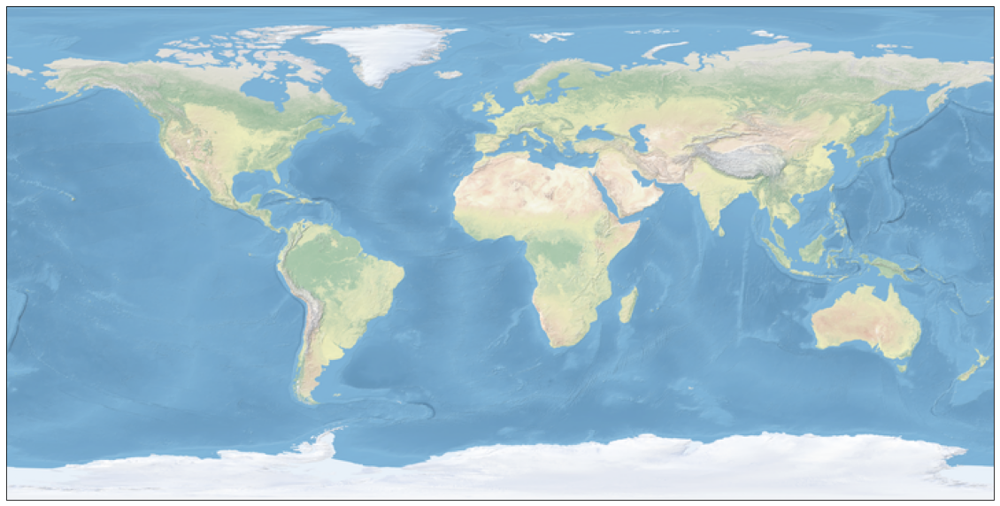

In [7]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(projection=ccrs.PlateCarree())
ax.stock_img();

In [8]:
ax.scatter(coordinates["lng"], coordinates["lat"], color='blue', marker='o', s=0.1, transform=ccrs.PlateCarree());

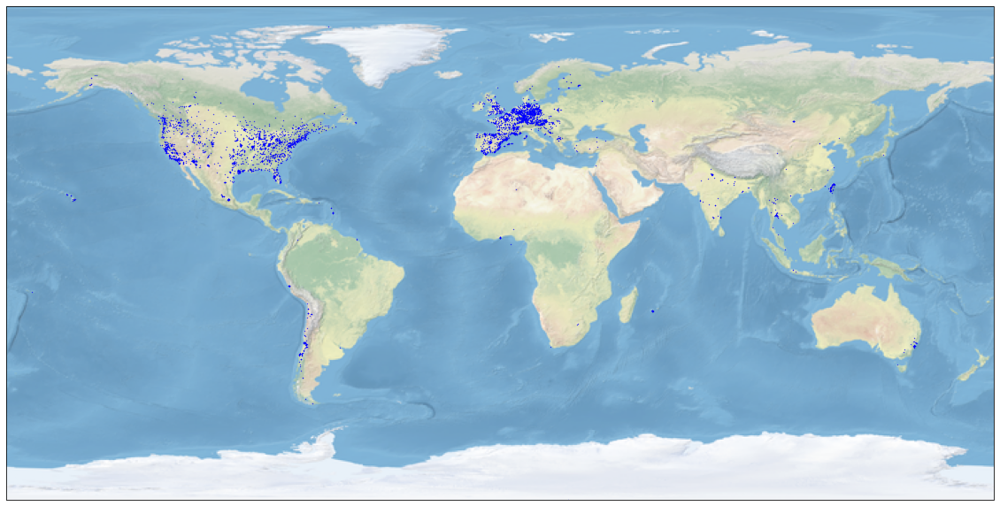

In [9]:
fig

In [37]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?limit=2000")
time_series_temp = resp.json()

len(time_series_temp)

1999

In [40]:
time_series_temp[4]

{'id': 76,
 'label': '',
 'order': 1,
 'sampling_frequency': 'hourly',
 'aggregation': 'mean',
 'data_start_date': '1999-07-02T17:00:00+00:00',
 'data_end_date': '2021-06-16T11:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 27,
  'codes': ['DENW094'],
  'name': 'Aachen-Burtscheid',
  'coordinates': {'lat': 50.754704, 'lng': 6.093923, 'alt': 205.0},
  'coordinate_validation_status': 'not checked',
  'country': 'Germany',
  'state': 'Nordrhein-Westfalen',
  'type': 'background',
  'type_of_area': 'urban',
  'timezone': 'Europe/Berlin',
  'additional_metadata': {'station_alt_flag': '0',
   'google_resolution': '153',
   'station_google_alt': '200',
   'station_reported_alt': '205',
   'station_landcover_description': 'Mixedforest:32.8%,Cropland/Naturalvegetationmosaic:29.2%,Urbanandbuilt-up:16.5%,Croplands:15.9%,Grasslands:3.5%,EvergreenNeedleleafforest:1.9%

In [39]:
for i in range(1,10000):
    print(time_series_temp[i]['variable']['name'])

o3
no2
no
temp
wspeed
wdir
pm10
press
cloudcover
u
pblheight
v
totprecip
relhum
humidity
no
no2
cloudcover
u
pblheight
v
totprecip
temp
relhum
press
humidity
no2
no
press
wdir
wspeed
temp
cloudcover
u
pblheight
v
totprecip
relhum
humidity
pm10
pm2p5
o3
wspeed
temp
wdir
no2
no
cloudcover
u
pblheight
v
totprecip
relhum
press
humidity
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm2p5
pm2p5
pm2p5
pm10
pm2p5
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm2p5
pm2p5
pm2p5
pm2p5
pm2p5
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
co
o3
no2
so2
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm10
pm10
pm10
pm10
pm10
pm10
pm2p5
pm10
o3


IndexError: list index out of range

In [121]:
for i in range(1,10000):
    print(time_series_temp[i]['variable']['name'])

no2
no
temp
wspeed
wdir
pm10
press
cloudcover
u
pblheight
v
totprecip
relhum
humidity
no
no2
cloudcover
u
pblheight
v
totprecip
temp
relhum
press
humidity
no2
no
press
wdir
wspeed
temp
cloudcover
u
pblheight
v
totprecip
relhum
humidity
pm10
pm2p5
o3
wspeed
temp
wdir
no2
no
cloudcover
u
pblheight
v
totprecip
relhum
press
humidity
pm2p5
pm10
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm2p5
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm10
pm10
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm2p5
pm10
pm10
pm2p5
pm2p5
pm10
press
pm2p5
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
relhum
no
no
no
no
no
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp
temp


IndexError: list index out of range

In [29]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=FR&variable_id=49&limit=200")
time_series_temp = resp.json()
len(time_series_temp)

0

In [30]:
for i in range(0,10000):
    time_series_temp[i]['variable']['name']

IndexError: list index out of range

In [93]:
## We are going for France first.

resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?country=FR&variable_id=49&limit=200")
time_series_temp = resp.json()
len(time_series_temp)
# print them if we want...
#pp.pp(time_series)

0

In [62]:
time_series_temp[1]['variable']['name']

IndexError: list index out of range

In [26]:
df_no2 = pd.DataFrame()

In [30]:
# Just checking here that the first request makes sense
for i in range(1,3):
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id=39145&sampling=daily&names=dma8eu&format=csv")
    data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
    print(data)

               dma8eu
datetime             
2015-01-01  12.812765
2015-01-02  16.326470
2015-01-03  12.845451
2015-01-04  13.760648
2015-01-05  16.996525
...               ...
2016-12-27  19.388459
2016-12-28  16.543502
2016-12-29  13.881585
2016-12-30  12.760468
2016-12-31   7.864815

[731 rows x 1 columns]
               dma8eu
datetime             
2015-01-01  12.812765
2015-01-02  16.326470
2015-01-03  12.845451
2015-01-04  13.760648
2015-01-05  16.996525
...               ...
2016-12-27  19.388459
2016-12-28  16.543502
2016-12-29  13.881585
2016-12-30  12.760468
2016-12-31   7.864815

[731 rows x 1 columns]


In [31]:
# This looks works nicely. Checked that we are not including duplicates.

# metadata for all timeseries for ozone in France
for d in time_series_no2[1:60]:
    
    print(d['id'])
    print('Beginning retrieval')
    resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    print('Data retrieved')
    try:
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('Data read into pandas')
        new_data = data.assign(timeseries_id = d['id'], 
                           station_id = d['station']['id'],
                           variable_name = d['variable']['name'],
                           station_name = d['station']['name'], 
                           lat = d['station']['coordinates']['lat'], 
                           lon = d['station']['coordinates']['lng']
                           )
    #data = data.append(new_meta_row, ignore_index=True)
    
        df_no2 = pd.concat([df_no2, new_data], axis = 0)  
        print('Data concatenated')
    except:
        print('File could not be read')
    #new_meta_row = {'timeseries_id': d['id'], 'station_id': d['station']['id'], 'variable_name': d['variable']['name'],
     #               'station_name': d['station']['name'], 'lat': d['station']['coordinates']['lat'], 'lon': d['station']['coordinates']['lng']}
    #data['timeseries_id'] = d['id']


39145
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39146
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39147
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39148
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39149
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39150
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39151
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39152
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39153
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39154
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39155
Beginning retrieval
Data retrieved
File could not be read
39156
Beginning retrieval
Data retrieved
Data read into pandas
Data concatenated
39157
Beginning retrieval
Data retrieved
Data

In [32]:
df_no2

,dma8eu,timeseries_id,station_id,variable_name,station_name,lat,lon
datetime,,,,,,,
2015-01-01,12.812765,39145,12462,no2,Nevers,46.996826,3.171092
2015-01-02,16.326470,39145,12462,no2,Nevers,46.996826,3.171092
2015-01-03,12.845451,39145,12462,no2,Nevers,46.996826,3.171092
2015-01-04,13.760648,39145,12462,no2,Nevers,46.996826,3.171092
2015-01-05,16.996525,39145,12462,no2,Nevers,46.996826,3.171092
...,...,...,...,...,...,...,...
2016-12-25,37.179898,39203,3549,no2,A7 Nord-Isère,45.353186,4.804822
2016-12-26,41.690515,39203,3549,no2,A7 Nord-Isère,45.353186,4.804822
2016-12-27,35.316818,39203,3549,no2,A7 Nord-Isère,45.353186,4.804822


## Let's try to find the station ids of all stations in France and then grab all variables

In [201]:
time_series_all[1]

{'id': 4916,
 'label': '',
 'order': 9,
 'sampling_frequency': 'irregular data samples of varying length',
 'aggregation': 'unknown',
 'data_start_date': '1900-01-01T00:00:00+00:00',
 'data_end_date': '1900-01-01T00:00:00+00:00',
 'data_origin': 'instrument',
 'data_origin_type': 'measurement',
 'provider_version': 'N/A',
 'sampling_height': 2.0,
 'additional_metadata': {},
 'station': {'id': 3534,
  'codes': ['FR29440', 'openaq_2666'],
  'name': 'COL_OEILLON',
  'coordinates': {'lat': 45.3895622059041,
   'lng': 4.61581342439134,
   'alt': -999.0},
  'coordinate_validation_status': 'not checked',
  'country': 'France',
  'state': 'unknown',
  'type': 'background',
  'type_of_area': 'rural',
  'timezone': 'N/A',
  'additional_metadata': {},
  'roles': [],
  'annotations': [],
  'aux_images': [],
  'aux_docs': [],
  'aux_urls': [],
  'globalmeta': {'mean_srtm_alt_90m_year1994': -999.0,
   'mean_srtm_alt_1km_year1994': -999.0,
   'max_srtm_relative_alt_5km_year1994': -999.0,
   'min_srtm

In [202]:
for d in time_series[1:4]:
    #print(d)
    print(d['station']['id'])

4432
4476
4318


In [205]:
station_df = pd.DataFrame()

In [207]:
f['id']

5739

In [13]:
resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(f['id'])+"&sampling=daily&names=dma8eu&format=csv")


NameError: name 'f' is not defined

In [ ]:
time_series_all

In [16]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?station_id="+str(d['station']['id'])+"&limit=20")


In [17]:
len(time_series_all)

300

In [23]:
len(particular_station_series)

8

In [38]:
for f in particular_station_series:
    print(f['id'])

4916
38898
40226
41386
41458
43298
43299
43358


In [44]:
particular_station_series[3]['id']

41386

In [ ]:
# I want some as dma8...and some as daily? So maybe this does need to be all done separately and the stitched together at the end.

In [60]:
resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id=40226&sampling=daily&names=dma8eu&format=csv")


In [61]:
resp_data.text

'Internal Server Error'

In [18]:
for d in time_series_all[1:4]:
    #print(d)
    print(d['station']['id'])
    
    resp = requests.get("https://toar-data.fz-juelich.de/api/v2/search/?station_id="+str(d['station']['id'])+"&limit=20")
    particular_station_series = resp.json()
    print(len(particular_station_series))
    station_df = pd.DataFrame()
    for f in particular_station_series:
        print('reading files')
        resp_data = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(f['id'])+"&sampling=daily&names=dma8eu&format=csv")
        print('reading data to pandas')
        data = pd.read_csv(StringIO(resp_data.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        print('assigning extras')
        new_data = data.assign(timeseries_id = f['id'], 
                           station_id = f['station']['id'],
                           variable_name = f['variable']['name'],
                           station_name = f['station']['name'], 
                           lat = f['station']['coordinates']['lat'], 
                           lon = f['station']['coordinates']['lng']
                           )
        print('concatenating series from a particular station')
        station_df = pd.concat([station_df, new_data], axis = 0)

    
        
    #data = data.append(new_meta_row, ignore_index=True)
    print('concatenation to a mega frame')
    df = pd.concat([df, station_df], axis = 0)
    

3534
8
reading files
reading data to pandas


ValueError: 'datetime' is not in list

In [119]:
data

,dma8eu,lat,lon,station_id,station_name,timeseries_id,variable_name
0,34.240958,NaN,NaN,NaN,NaN,NaN,NaN
1,16.559716,NaN,NaN,NaN,NaN,NaN,NaN
2,17.163890,NaN,NaN,NaN,NaN,NaN,NaN
3,19.241350,NaN,NaN,NaN,NaN,NaN,NaN
4,25.906947,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2918,30.819994,NaN,NaN,NaN,NaN,NaN,NaN
2919,25.713612,NaN,NaN,NaN,NaN,NaN,NaN
2920,17.361700,NaN,NaN,NaN,NaN,NaN,NaN
2921,24.059520,NaN,NaN,NaN,NaN,NaN,NaN


In [113]:
df.isna().sum()

dma8eu           2558
lat              2922
lon              2922
station_id       2922
station_name     2922
                 ... 
lon              2922
station_id       2922
station_name     2922
timeseries_id    2922
variable_name    2922
Length: 28, dtype: int64

In [105]:
new_meta_row

{'timeseries_id': 40618,
 'station_id': 4201,
 'variable_name': 'o3',
 'station_name': 'La Calmette',
 'lat': 43.925368232751,
 'lon': 4.26581182339269}

In [63]:
## Now trying to grab all the ozone records for France

In [51]:
df = pd.DataFrame()

In [73]:
for d in time_series:
    print(d['id'])
    print(d['variable']['name'])
    new_row = {'timeseries_id': d['id'],
               'data_capture': data['data_capture'],
               'country':data['metadata']['station_country'], 
               'variable_name':data['metadata']['parameter_name'],
               'variable_label':data['metadata']['parameter_label'],               
               'units':data['metadata']['parameter_original_units'],
               'station_etopo_alt':data['metadata']['station_etopo_alt'],
               'station_rel_etopo_alt':data['metadata']['station_etopo_relative_alt'],
               'lat':s[4],'lon':s[5],'NOx_emi':data['metadata']['station_nox_emissions'], 'OMI_NOx':data['metadata']['station_omi_no2_column'],
               'station_name':data['metadata']['station_name'], 'station_type':data['metadata']['station_type'],
               'altitude':data['metadata']['station_alt'], 'landcover':data['metadata']['station_dominant_landcover'],
               'pop_density':data['metadata']['station_population_density'], 'max_5km_pop_density':data['metadata']['station_max_population_density_5km'],
               'max_25km_pop_density':data['metadata']['station_max_population_density_25km'],
               'nightlight_1km':data['metadata']['station_nightlight_1km'], 'nightlight_max_25km':data['metadata']['station_max_nightlight_25km'],
               'toar_category':data['metadata']['station_toar_category'], 'measurement_method':data['metadata']['parameter_measurement_method']}
    df = df.append(new_row, ignore_index = True)
 
    

40614
o3


KeyError: 'data_capture'

In [21]:
# so we can access all the ids like this
# can also access which variable it is...
# then I suppose we want to access the metadata for each one too?
# I can access the id for each station too...

for d in time_series:
    print(d['id'])
    print(d['variable']['name'])
    station_data = ([])
    
    resp = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
    try:
        variable_data = pd.read_csv(StringIO(resp.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        
        df = pd.concat([df, data], axis=0)
    except:
        print('Cannot read the file')
    
        
    #print(d['station']['id'])
    #print(d['station']['globalmeta'])

40614
o3
40615
o3
40616
o3
40617
o3
40618
o3
40619
o3
40620
o3
40621
o3
40622
o3
40623
o3
40624
o3
40625
o3
40626
o3
40627
o3
40628
o3
40629
o3
40630
o3
40631
o3
40632
o3
40633
o3
40634
o3
40635
o3
40636
o3
40637
o3
40638
o3
40639
o3
40640
o3
40641
o3
Cannot read the file
40642
o3
Cannot read the file
40643
o3
40644
o3
40645
o3
40646
o3
40647
o3
40648
o3
40649
o3
40650
o3
40651
o3
40652
o3
40653
o3
40654
o3
40655
o3
40656
o3
40657
o3
40658
o3
40659
o3
40660
o3
40661
o3
40662
o3
40663
o3
40664
o3
40665
o3
40666
o3
40667
o3
40668
o3
40669
o3
40670
o3
Cannot read the file
40671
o3
40672
o3
40673
o3
40674
o3
40675
o3
40676
o3
40677
o3
40678
o3
40679
o3
40680
o3
40681
o3
40682
o3
40683
o3
40684
o3
40685
o3
40686
o3
40687
o3
40688
o3
40689
o3
40690
o3
40691
o3
40692
o3
40693
o3
40694
o3
40695
o3
40696
o3
40697
o3
40698
o3
40699
o3
40700
o3
40701
o3
40702
o3
40703
o3
40704
o3
40705
o3
40706
o3
40707
o3
40708
o3
40709
o3
40710
o3
40711
o3
40712
o3
40713
o3
40714
o3
40715
o3
40716
o3
40717
o3
4

KeyboardInterrupt: 

In [62]:
data

,dma8eu
datetime,
2016-01-01,25.155983
2016-01-02,31.029889
2016-01-03,32.095024
2016-01-04,32.162691
2016-01-05,28.695990
2016-01-06,26.127135
2016-01-07,36.393604
2016-01-08,29.056256
2016-01-09,33.786709


In [6]:
len(time_series)

969

In [6]:
len(time_series)

969

In [92]:
pd.set_option('max_rows', 10)

df.isna().sum()

Series([], dtype: float64)

In [93]:
pd.set_option('max_columns', 10)

df

""


In [ ]:
df

In [ ]:
# so we can access all the ids like this
# can also access which variable it is...
# then I suppose we want to access the metadata for each one too?
# I can access the id for each station too...

for d in time_series:
    print(d['id'])
    print(d['variable']['name'])
    try:
        resp = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv")
        data = pd.read_csv(StringIO(resp.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
        df = pd.concat([df, data], axis = 1)
    except:
        print('This record does not exist')
    
    #print(d['station']['id'])
    #print(d['station']['globalmeta'])

40614
o3
40615
o3
40616
o3
40617
o3
40618
o3
40619
o3
40620
o3
40621
o3
40622
o3
40623
o3
40624
o3
40625
o3
40626
o3
40627
o3
This record does not exist
40628
o3
40629
o3
40630
o3
40631
o3
This record does not exist
40632
o3
40633
o3
40634
o3
This record does not exist
40635
o3
This record does not exist
40636
o3
40637
o3
This record does not exist
40638
o3
This record does not exist
40639
o3
This record does not exist
40640
o3
This record does not exist
40641
o3
This record does not exist
40642
o3
This record does not exist
40643
o3
This record does not exist
40644
o3
This record does not exist
40645
o3
This record does not exist
40646
o3
This record does not exist
40647
o3
This record does not exist
40648
o3
This record does not exist
40649
o3
This record does not exist
40650
o3
This record does not exist
40651
o3
This record does not exist
40652
o3
40653
o3
40654
o3
40655
o3
40656
o3
40657
o3
40658
o3
40659
o3
40660
o3
40661
o3
40662
o3
40663
o3


In [ ]:
data

In [71]:
resp = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id=40641&sampling=daily&names=dma8eu&format=csv")
data = pd.read_csv(StringIO(resp.text), parse_dates=True, infer_datetime_format=True)
    

In [72]:
data

,Internal Server Error


In [69]:
df

,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,...,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu,dma8eu
datetime,,,,,,,,,,,,,,,,,,,,,
2013-01-01,33.814903,NaN,34.240958,NaN,37.774699,NaN,20.344078,NaN,41.410778,NaN,...,NaN,NaN,33.301132,NaN,NaN,NaN,34.723401,NaN,27.768696,NaN
2013-01-02,36.935122,NaN,16.559716,NaN,32.505414,NaN,28.909017,NaN,44.729404,NaN,...,NaN,NaN,9.993472,NaN,NaN,NaN,24.890146,NaN,21.904188,NaN
2013-01-03,24.498105,NaN,17.163890,NaN,33.589345,NaN,4.429708,NaN,44.760732,NaN,...,NaN,NaN,17.672290,NaN,NaN,NaN,21.252576,NaN,18.545880,NaN
2013-01-04,12.718965,NaN,19.241350,NaN,31.935253,NaN,9.742852,NaN,40.813467,NaN,...,NaN,NaN,17.198797,NaN,NaN,NaN,25.481788,NaN,13.533480,NaN
2013-01-05,15.030934,NaN,25.906947,NaN,27.825085,NaN,26.878995,NaN,43.701862,NaN,...,NaN,NaN,22.255056,NaN,NaN,NaN,29.995634,NaN,11.841795,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,NaN,NaN,33.733452,NaN,NaN,33.420177,NaN,NaN,NaN,NaN,...,37.818558,NaN,33.376319,NaN,31.277376,NaN,NaN,NaN,NaN,NaN
2020-12-28,NaN,NaN,30.819994,NaN,NaN,33.971541,NaN,NaN,NaN,NaN,...,30.068134,NaN,33.877558,NaN,31.358827,NaN,NaN,NaN,NaN,NaN
2020-12-29,NaN,NaN,25.713612,NaN,NaN,31.070614,NaN,NaN,NaN,NaN,...,25.738674,NaN,30.763605,NaN,26.597047,NaN,NaN,NaN,NaN,NaN


In [48]:
resp = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id=24896&sampling=daily&names=dma8eu&format=csv")

data = pd.read_csv(StringIO(resp.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
print(data)

               dma8eu
datetime             
2014-01-01   6.390810
2014-01-02   3.383370
2014-01-03   3.174520
2014-01-04        NaN
2014-01-05  33.499540
...               ...
2020-12-27  21.302700
2020-12-28  19.798980
2020-12-29  17.113766
2020-12-30  18.107295
2020-12-31  16.728885

[2557 rows x 1 columns]


We can also run multiple statistics at once but we have to choose one specific sampling frequency.

In [ ]:
resp = requests.get("https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id=24896&sampling=daily&names=median,dma8eu,daytime_avg&format=csv")

data = pd.read_csv(StringIO(resp.text), index_col="datetime", parse_dates=True, infer_datetime_format=True)
print(data)

sampling can be one of daily, monthly, seasonal, summer or annual. For available statistics and further information see https://toar-data.fz-juelich.de/statistics/api/v1/.

In [ ]:
# So this is simplistic usage. What we really want to do is some kind of swapping in and out of the time series id, 
# which we will extract from the code above

In [26]:
# Then append it all to a dataframe? 
# Need also to grab the station meta data...
# We can do it for more than one species...

# How do we append sensibly is the question??

In [ ]:
## maybe I want to do the metadata grab as showing in loading_metadata...

In [ ]:
# some rewrite of this would be useful...

for s in metadata:
    all_dataseries = s[0]
    
    for series in all_dataseries:
        print("Opening URL2...")
        dresponse = urlopen(BASEURL + URL2  % series).read().decode('utf-8')
        data = json.loads(dresponse)
        
    # do something with the data
    new_row = {'id': all_dataseries[0], 'avg_values': data['average_values'], 'datetime':data['datetime'],
               'data_capture': data['data_capture'],
               'country':data['metadata']['station_country'], 
               'variable_name':data['metadata']['parameter_name'],
               'variable_label':data['metadata']['parameter_label'],               
               'units':data['metadata']['parameter_original_units'],
               'station_etopo_alt':data['metadata']['station_etopo_alt'],
               'station_rel_etopo_alt':data['metadata']['station_etopo_relative_alt'],
               'lat':s[4],'lon':s[5],'NOx_emi':data['metadata']['station_nox_emissions'], 'OMI_NOx':data['metadata']['station_omi_no2_column'],
               'station_name':data['metadata']['station_name'], 'station_type':data['metadata']['station_type'],
               'altitude':data['metadata']['station_alt'], 'landcover':data['metadata']['station_dominant_landcover'],
               'pop_density':data['metadata']['station_population_density'], 'max_5km_pop_density':data['metadata']['station_max_population_density_5km'],
               'max_25km_pop_density':data['metadata']['station_max_population_density_25km'],
               'nightlight_1km':data['metadata']['station_nightlight_1km'], 'nightlight_max_25km':data['metadata']['station_max_nightlight_25km'],
               'toar_category':data['metadata']['station_toar_category'], 'measurement_method':data['metadata']['parameter_measurement_method']}
              #}
    df = df.append(new_row, ignore_index = True)

In [ ]:
"https://toar-data.fz-juelich.de/statistics/api/v1/?timeseries_id="+str(d['id'])+"&sampling=daily&names=dma8eu&format=csv"

In [68]:
### Ok, try again with this metadata business...


metadata = json.loads("\n".join([line[1:] for line in resp.text.split("\n") if line.startswith("#")]))
pp.pp(metadata)

ValueError: 'datetime' is not in list

In [71]:
resp = requests.get("https://toar-data.fz-juelich.de/api/v2/data/timeseries/40618?format=csv")

KeyboardInterrupt: 

In [ ]:
print(resp.text[:10000])

In [ ]:
data